In [2]:
import Pkg

In [3]:

Pkg.add("FFTW")

    Updating registry at `C:\Users\Nicholas\.julia\registries\General.toml`


   Resolving package versions...

   Installed JLLWrappers ───── v1.4.1


   Installed IntelOpenMP_jll ─ v2018.0.3+2


   Installed MKL_jll ───────── v2022.2.0+0
   Installed Reexport ──────── v1.2.2


   Installed Preferences ───── v1.3.0


   Installed AbstractFFTs ──── v1.2.1


   Installed FFTW ──────────── v1.5.0


   Installed FFTW_jll ──────── v3.3.10+0
   Installed ChainRulesCore ── v1.15.6
   Installed Compat ────────── v4.3.0


    Updating `C:\Users\Nicholas\.julia\environments\v1.8\Project.toml`
  [7a1cc6ca] + FFTW v1.5.0
    Updating `C:\Users\Nicholas\.julia\environments\v1.8\Manifest.toml`
  [621f4979] + AbstractFFTs v1.2.1
  [d360d2e6] + ChainRulesCore v1.15.6
  [34da2185] + Compat v4.3.0
  [7a1cc6ca] + FFTW v1.5.0
  [692b3bcd] + JLLWrappers v1.4.1
  [21216c6a] + Preferences v1.3.0
  [189a3867] + Reexport v1.2.2
  [f5851436] + FFTW_jll v3.3.10+0
  [1d5cc7b8] + IntelOpenMP_jll v2018.0.3+2
  [856f044c] + MKL_jll v2022.2.0+0
  [4af54fe1] + LazyArtifacts


Precompiling project...


  ✓ Reexport


  ✓ Compat


  ✓ Preferences

  ✓ JLLWrappers


  ✓ ChainRulesCore


  ✓ IntelOpenMP_jll
  ✓ FFTW_jll

  ✓ AbstractFFTs


  ✓ MKL_jll


  ✓ FFTW
  10 dependencies successfully precompiled in 10 seconds. 14 already precompiled.


In [10]:
Pkg.add("Plots")

   Resolving package versions...


  No Changes to `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Project.toml`
  No Changes to `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Manifest.toml`

In [3]:
using FFTW
Y=fft([0;1;2;1])

4-element Vector{ComplexF64}:
  4.0 + 0.0im
 -2.0 + 0.0im
  0.0 + 0.0im
 -2.0 + 0.0im

In [2]:
using Plots

plot([1;2;3;4])

ErrorException: syntax: unexpected semicolon in array expression around c:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\playground.ipynb:3

In [1]:
t = range(0,1,44000)   # Time points
x = sin.(2π* 40t)   

44000-element Vector{Float64}:
  0.0
  0.0057120854010192755
  0.011423984427054905
  0.017135510709204323
  0.022846477890726916
  0.028556699633124516
  0.03426598962222127
  0.039974161574242766
  0.045681029241894086
  0.051386406420436764
  ⋮
 -0.04568102924190581
 -0.039974161574261355
 -0.034265989622218315
 -0.02855669963312842
 -0.022846477890737682
 -0.01713551070922195
 -0.011423984427050978
 -0.00571208540102221
 -9.797174393178826e-15

In [14]:
using FFTW

"""
    _stft(x_odd_extention, window)
Helper function that takes the odd extention of x (length 3N
where N isthe number of samples of x), and a window of length 2N,
abd computes the fft of the windowed signal.
"""

function _stft(x_odd_extention, window)
    N = length(window)÷2 #original length of signal
    n_time_steps = N
    X = zeros(Complex, N, n_time_steps)
    for i ∈ 1:n_time_steps
        left  = i
        right = i + 2N-1
        slice = left:right
        x_trunc = x_odd_extention[slice]
        X[:,i]  = fft(x_trunc .* window)[1:N]#Just want the non negative frequencies
    end
    return X
end

"""
    STFT(x::Vector{Complex}, t::Vector{Real}, width::Real)

Takes ```math x(t)``` and returns the STFT of x, X, and the frequencies k.
A Gaussian window is used with the width needed as an input.
"""
function mySTFT(x, t, width)#::Vector{Complex}, t::AbstractVector, width::Real)
    # Make window
    N = length(t)
    right = (t[end] - t[1])
    left  = - right #+ length(t) % 2
    times = Vector(range(left, right, 2N))
    window = exp.(-(times ./ width).^2 ./ 2)
    
    # Make odd extention of x
    xr = -reverse(x)
    odd_extention = cat(xr, x, xr, dims=1) # could make this better by not duplicating x(t[1])
    
    # Take STFT
    X = _stft(odd_extention, window)#stft(odd_extention, window, N)#
    
    # Calculate frequencies
    Δt = t[2] - t[1]
    sample_rate = 1 / Δt
    k = Vector(range(0, sample_rate/2, N))

    return X, k
end

mySTFT

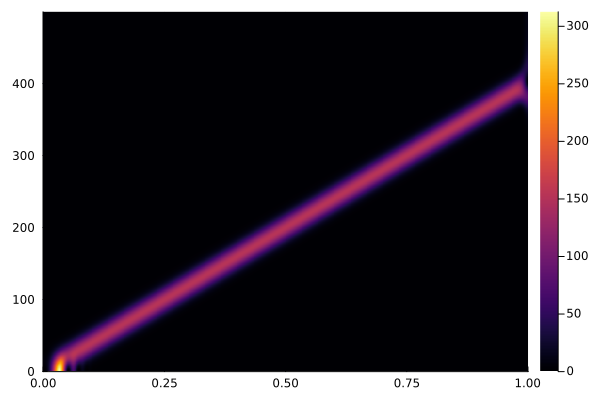

In [239]:
using Plots

t = Vector(range(0, 1, 1000)) # Time points
x = sin.(2π*200t.^2) # Generate mock signal
width = 0.01
X, k = mySTFT(x, t, width)  # Analysis

s = abs2.(X)
heatmap(t, k, s)
#heatmap(s)

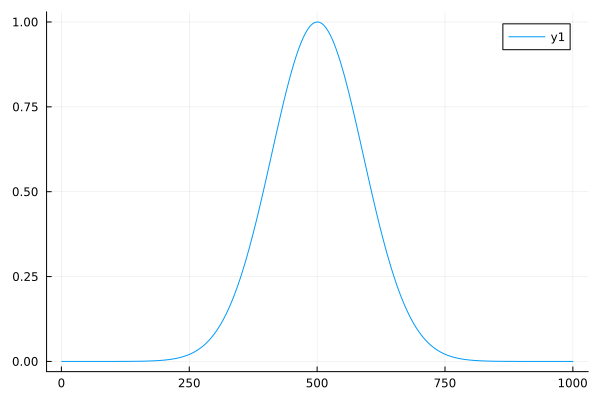

In [201]:
N = length(t)
right = (t[end] - t[1])/2
left  = - right #+ length(t) % 2
times = Vector(range(left, right, N))
window = exp.(-(times ./ width).^2 ./ 2) #

plot(window)

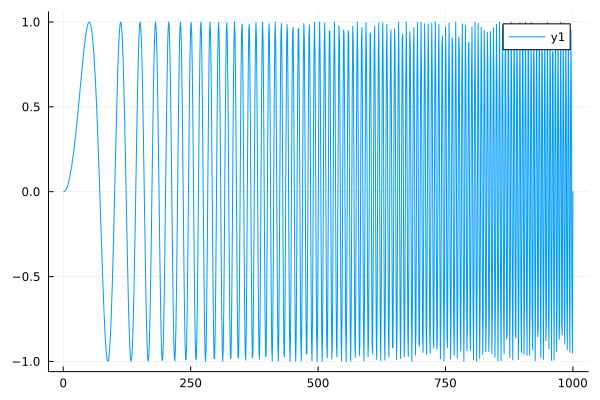

In [217]:
plot(x)

In [3]:
Pkg.add("WAV")

    Updating registry at `C:\Users\Nicholas\.julia\registries\General.toml`


   Resolving package versions...


    Updating `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Project.toml`
  [8149f6b0] + WAV v1.2.0
    Updating `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Manifest.toml`


  [5789e2e9] + FileIO v1.16.0
  [8149f6b0] + WAV v1.2.0


Precompiling project...


  ✗ TensorDecompSTFT


  0 dependencies successfully precompiled in 6 seconds. 136 already precompiled.
  1 dependency errored. To see a full report either run `import Pkg; Pkg.precompile()` or load the package


In [5]:
Pkg.precompile()

Precompiling project...


  ✓ TensorDecompSTFT
  1 dependency successfully precompiled in 2 seconds. 141 already precompiled.


In [4]:
using WAV
fs = 8e3
t = 0.0:1/fs:prevfloat(1.0)
f = 1e3
y = sin.(2pi * f * t) * 0.1
wavwrite(y, "example.wav", Fs=fs)

y, fs = wavread("example.wav")
y = sin.(2pi * 2f * t) * 0.1
wavappend(y, "example.wav")

y, fs = wavread("example.wav")
wavplay(y, fs)

In [3]:
Pkg.add("STFT")

    Updating registry at `C:\Users\Nicholas\.julia\registries\General.toml`


   Resolving package versions...


    Updating `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Project.toml`
  [58bb99bf] + STFT v1.0.1
    Updating `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Manifest.toml`


  [58bb99bf] + STFT v1.0.1


In [33]:
"""
    triange(n::Int)
Makes a single triangle bump with n samples with peak value of 1
"""

function triangle(n::Int)
    up   = range(0,1,length=(n+1)÷2)
    down = reverse(up)[2:end]
    return cat(up, down,dims=1)
end

function triangle2(N::Int)
    n = 0:N
    w = @. 1 - abs( (n - N/2) / ((N+1) ÷ 2))
    return w    
end

triangle2 (generic function with 1 method)

In [124]:
a = 1:10
b = (1:10) * 2
a * b - b

MethodError: MethodError: no method matching *(::UnitRange{Int64}, ::StepRangeLen{Int64, Int64, Int64, Int64})
Closest candidates are:
  *(::Any, ::Any, !Matched::Any, !Matched::Any...) at operators.jl:591
  *(!Matched::LinearAlgebra.UniformScaling, ::AbstractVecOrMat) at C:\Users\Nicholas\.julia\juliaup\julia-1.8.2+0.x64\share\julia\stdlib\v1.8\LinearAlgebra\src\uniformscaling.jl:262
  *(!Matched::LinearAlgebra.AbstractRotation{T}, ::AbstractVecOrMat{S}) where {T, S} at C:\Users\Nicholas\.julia\juliaup\julia-1.8.2+0.x64\share\julia\stdlib\v1.8\LinearAlgebra\src\givens.jl:9
  ...

In [9]:
"""
    hann(n::Int)
Makes a Hann window with N samples with peak value of 1.
If N is even, will return N+1 samples.
"""

function hann(N::Int)
    N = N - N % 2 #makes N even
    n = 0:N
    w = @. sin(π*n/N)^2
end

hann (generic function with 1 method)

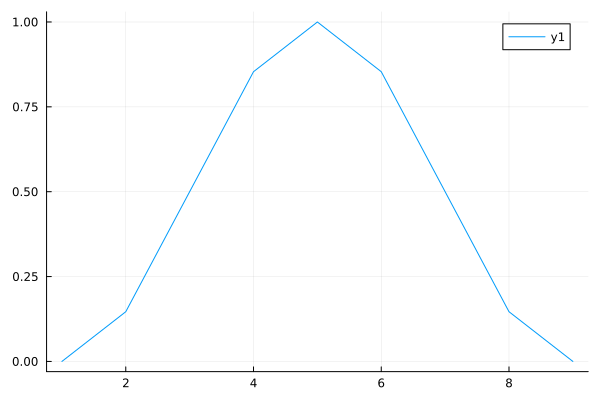

In [10]:
using Plots
x = hann(9)
plot(x)

In [14]:
using STFT
t = Vector(range(0, 1, 2000)) # Time points
x = sin.(2π*200t.^2) # Generate mock signal
w = 91
window = hann(w)
Y = stft(x, window, w÷2 - 1);
x_out = istft(Y, window, w÷2 - 1);

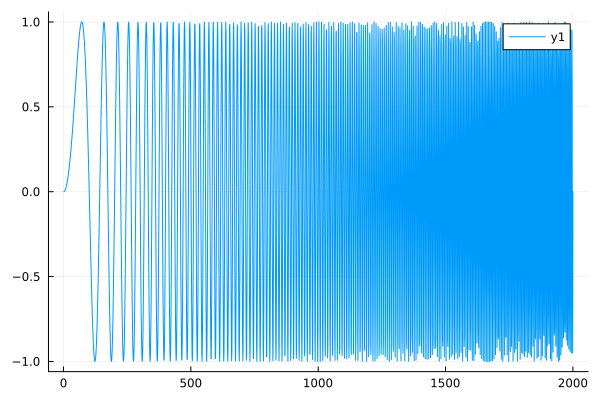

In [93]:
plot(x)

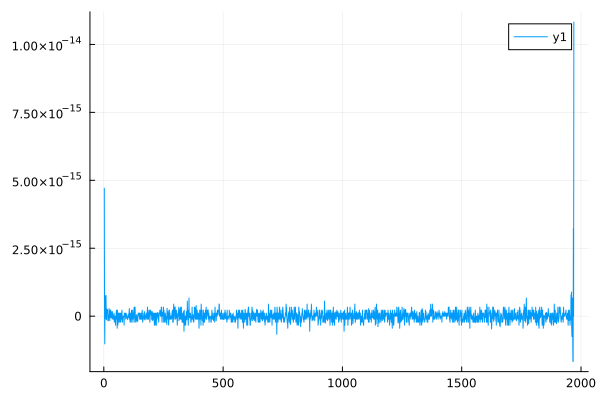

In [92]:
plot(x[1:end-29]-x_out)

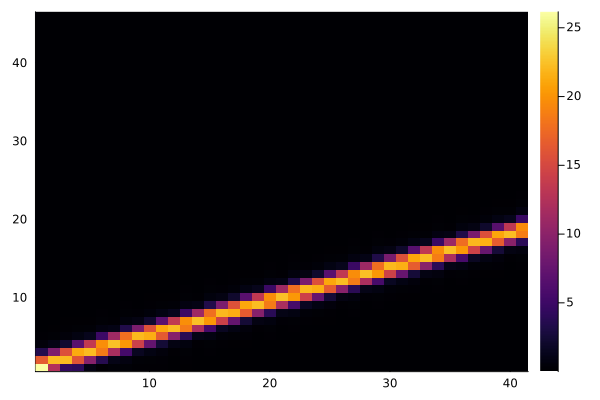

In [15]:
using Plots
s=abs.(Y)
heatmap(s)

In [15]:
width = 0.01
Y, k = mySTFT(y,t,width);

(Complex[0.0707376106360296 + 0.0im 0.07072655127702941 + 0.0im … -3.773505273550748e-5 + 0.0im -1.8871950714954844e-5 + 0.0im; -0.07073763314641474 - 2.778973215972517e-5im -0.07072655740164918 - 5.558189595528617e-5im … 3.776301105637425e-5 + 4.740295484444244e-5im 1.88812790177309e-5 + 4.743261702989574e-5im; … ; -0.029291709340713037 + 2.3007983718244685e-5im 0.02928710540837887 - 4.601108715561724e-5im … -0.041409481830103526 - 4.878783178475718e-5im 0.04141921316341801 + 1.6266994584058364e-5im; 0.02929170735443609 - 1.15039893043168e-5im -0.02928712375325701 + 2.3005543792187916e-5im … 0.04140950016857656 + 2.4393918229986995e-5im -0.04141921234158728 - 8.13349681685763e-6im], [0.0, 0.5000625078134767, 1.0001250156269534, 1.50018752344043, 2.000250031253907, 2.5003125390673833, 3.00037504688086, 3.500437554694337, 4.000500062507814, 4.50056257032129  …  3995.499437429679, 3995.999499937492, 3996.499562445306, 3996.999624953119, 3997.499687460933, 3997.999749968746, 3998.49981247

In [17]:
s = abs2.(Y)
heatmap(t, k, s)

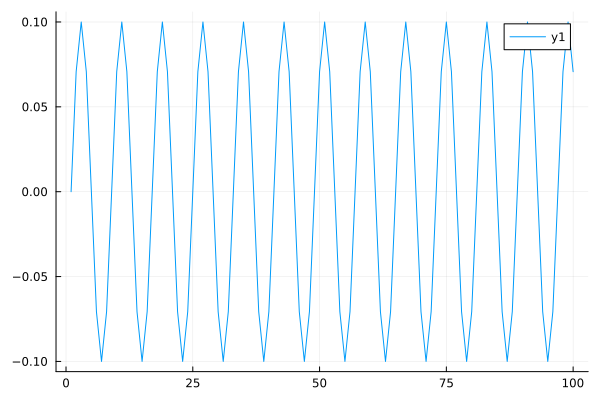

In [13]:
using Plots
plot(y[1:100])

In [6]:
using WAV

y, fs = wavread("..\\stems\\A Classic Education - NightOwl\\bass.wav")
N = length(y)
t = range(0, N/fs, length=N)

0.0f0:2.267574f-5:342.88037f0

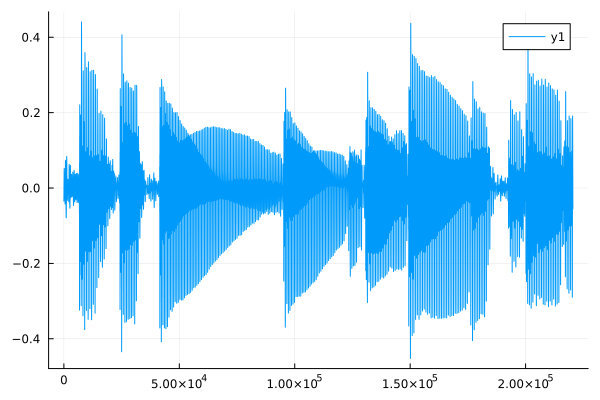

In [11]:
s = 10
l = 5

x = y[s*Int(fs):(s+l)*Int(fs),1] #l seconds

plot(x)

In [75]:
wavplay(x, fs)

In [13]:
using STFT

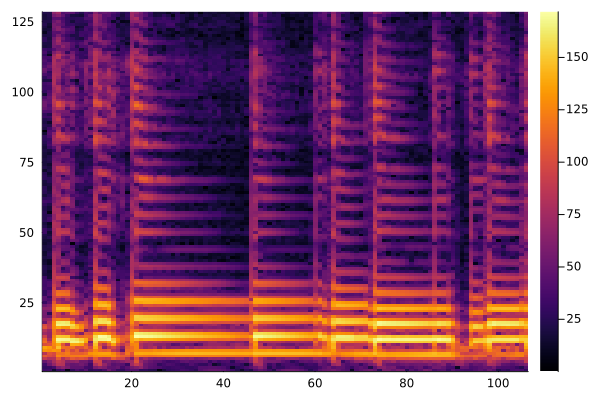

In [14]:
w = 2^12
window = hann(w)
#Y = stft(x, window, w-1);
Y = stft(x, window, w÷2 - 1);
#x_out = istft(Y, window, w÷2 - 1);

s=abs.(Y)
heatmap((log.(s[1:end÷16,:]).+8).^2)

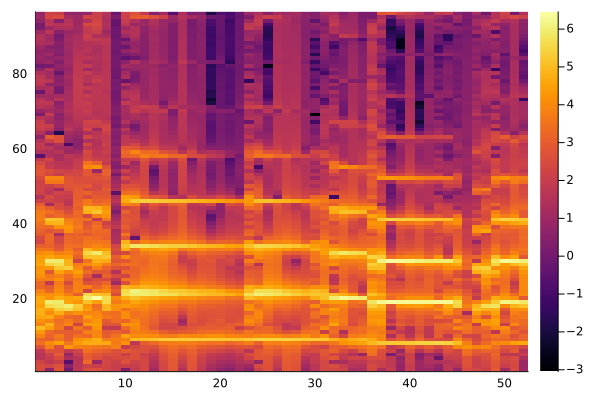

In [38]:
w = 2^13
window = ones(w)
#Y = stft(x, window, w-1);
Y = stft(x, window, w÷2 - 1);
#x_out = istft(Y, window, w÷2 - 1);

s=abs.(Y)
heatmap(log.(s[5:100,:]))

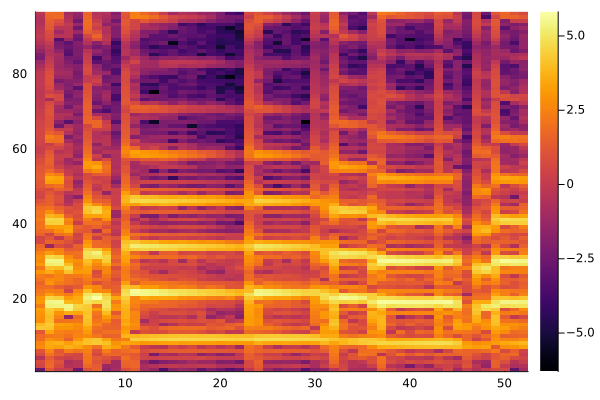

In [39]:
w = 2^13
window = triangle(w)
#Y = stft(x, window, w-1);
Y = stft(x, window, w÷2 - 1);
#x_out = istft(Y, window, w÷2 - 1);

s=abs.(Y)
heatmap(log.(s[5:100,:]))

In [22]:
using TensorDecompositions

In [77]:
A = randn(10,10)
B = randn(10,10)
C = randn(10,10)
T = cat(A,B,C,dims=3);

In [ ]:
(2049, 106, 2)

In [28]:
F = candecomp(B, 1, (randn(2049, 1), randn(106, 1), randn(2, 1)), method=:ALS, verbose=true)

┌ Info: initializing factor matrices...
└ @ TensorDecompositions C:\Users\Nicholas\.julia\packages\TensorDecompositions\3BVk2\src\candecomp.jl:68
┌ Info: applying candecomp ALS method...
└ @ TensorDecompositions C:\Users\Nicholas\.julia\packages\TensorDecompositions\3BVk2\src\candecomp.jl:71


ALS iterations   2%|█                                   |  ETA: 0:03:09

ALS iterations 100%|████████████████████████████████████| Time: 0:00:06


┌ Info: Algorithm converged after 7 iterations.
└ @ TensorDecompositions C:\Users\Nicholas\.julia\packages\TensorDecompositions\3BVk2\src\utils.jl:233


CANDECOMP{Float64, 3}(([-0.00026444242752872064; -0.0004097990123933723; … ; -1.4594565944334192e-6; -1.5594017477387268e-6;;], [-0.0017251507908327304; -0.000995445315004127; … ; -0.01057453306844315; -0.010486979788302443;;], [0.5; 0.5;;]), [143942.22434955696], Dict{Symbol, Any}())

In [31]:
F.factors[1]

2049×1 Matrix{Float64}:
 -0.00026444242752872064
 -0.0004097990123933723
 -0.0010213460795182002
 -0.0020103127050224478
 -0.0063220292264859895
 -0.0332940959556114
 -0.04534170460827984
 -0.02192735047463772
 -0.012394053924683674
 -0.013351578338257833
  ⋮
 -1.4395555600947676e-6
 -1.5196238803798433e-6
 -1.4137227434374584e-6
 -1.430938974746045e-6
 -1.5773560716128778e-6
 -1.5698158415983199e-6
 -1.3903325280835726e-6
 -1.4594565944334192e-6
 -1.5594017477387268e-6

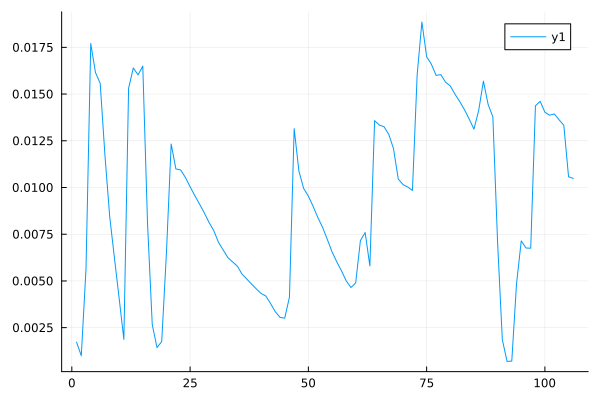

In [38]:
plot(-F.factors[2][:])

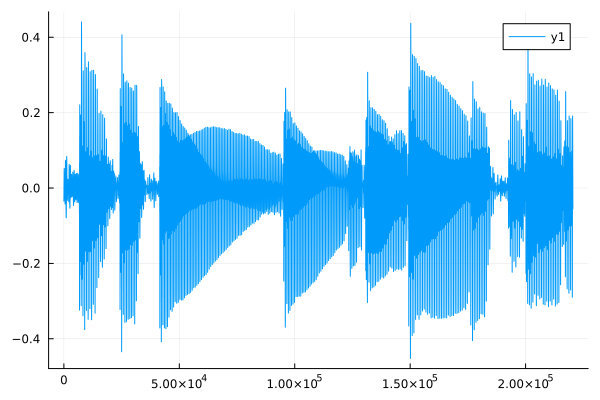

In [39]:
plot(x)

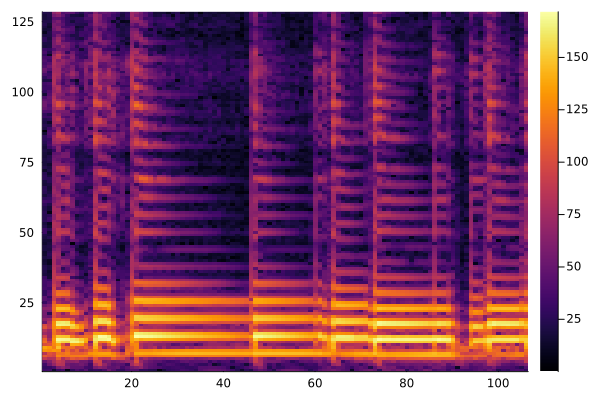

In [37]:
s=abs.(Y)
heatmap((log.(s[1:end÷16,:]).+8).^2)

In [20]:
using Tensorial

a = Vec(1,2,3,4,5)
b = Vec(1,2,3,4)
c = Vec(1,2,3)

T = a ⊗ b ⊗ c

5×4×3 Tensor{Tuple{5, 4, 3}, Int64, 3, 60}:
[:, :, 1] =
 1   2   3   4
 2   4   6   8
 3   6   9  12
 4   8  12  16
 5  10  15  20

[:, :, 2] =
  2   4   6   8
  4   8  12  16
  6  12  18  24
  8  16  24  32
 10  20  30  40

[:, :, 3] =
  3   6   9  12
  6  12  18  24
  9  18  27  36
 12  24  36  48
 15  30  45  60

In [25]:
B = cat(s, s, dims=3);

In [27]:
size(B)

(2049, 106, 2)

In [81]:
workspace()

reload(".\\src\\songstrings.jl")

UndefVarError: UndefVarError: workspace not defined

In [84]:
include(".\\src\\songstrings.jl")

Main.songstrings

In [136]:
songstrings.filenames["bass"][12:14]

3-element Vector{String}:
 "..\\stems\\Jokers, Jacks & Kings - Sea Of Leaves\\bass.wav"
 "..\\stems\\Leaf - Come Around\\bass.wav"
 "..\\stems\\Leaf - Wicked\\bass.wav"

In [137]:
filenames["bass"][12:14]

3-element Vector{String}:
 "..\\stems\\Jokers\\bass.wav"
 "..\\stems\\ Jacks & Kings - Sea Of Leaves\\bass.wav"
 "..\\stems\\Leaf - Come Around\\bass.wav"

In [92]:
# open all bass instruments

instrument = "bass"

songstart  = 1 #start from the begining
songlength = 5 #seconds

windowsize = 2^12
window = hann(windowsize)
hop = windowsize÷2 - 1

# take the STFT of all of them TODO Slicing could be optimized since fs is the same
function songspectrogram(filename::String)
    y, fs = wavread(filename)
    left  = songstart * fs
    right = left + songlength * fs
    slice = Int(left):Int(right)
    y = y[slice]
    Y = stft(y, window, hop)
    return abs.(Y)
end 

# Create Tensor
T = cat(map(songspectrogram, songstrings.filenames[instrument])..., dims=3)
num_freqs, num_times, num_songs = size(T)

(2049, 106, 27)

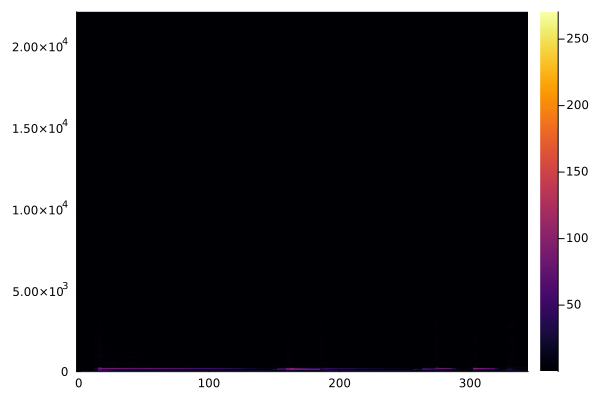

In [123]:
# Plot the first spectrogram to test everything worked
song1 = T[:,:,1]

sample_rate = 44100

max_freq  = sample_rate/2
freqs = range(0, max_freq, num_freqs)
times = range(0, t[end]  , num_times)

crop = 2:(num_freqs÷2)

heatmap(times, freqs, song1) # original spectrogram

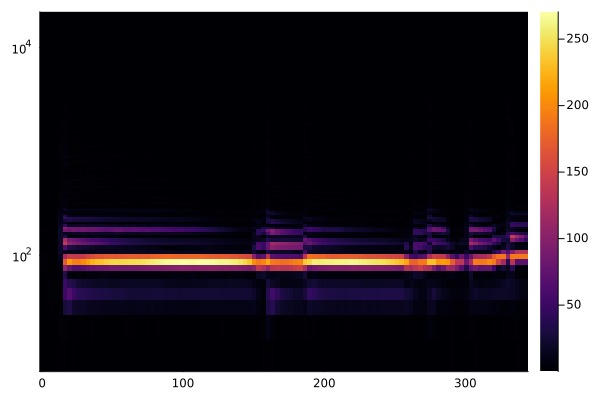

In [124]:
heatmap(times, freqs[2:end], song1[2:end,:], yscale=:log10)

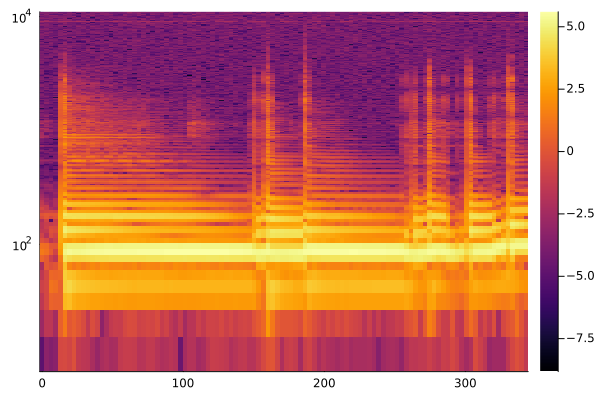

In [126]:
heatmap(times, freqs[crop], log.(song1[crop,:]), yscale=:log10)#, yticks=1:500:(max_freq÷2)) # cropped log spectrogram

In [108]:
# perform rank 1 decomposition (at first)
rank = 1
init_guess = map(n -> randn(n, 1), size(T)) #(randn(num_freqs, 1), randn(num_times, 1), randn(num_songs, 1))
F = candecomp(T, rank, init_guess, method=:ALS, verbose=true)

┌ Info: initializing factor matrices...
└ @ TensorDecompositions C:\Users\Nicholas\.julia\packages\TensorDecompositions\3BVk2\src\candecomp.jl:68
┌ Info: applying candecomp ALS method...
└ @ TensorDecompositions C:\Users\Nicholas\.julia\packages\TensorDecompositions\3BVk2\src\candecomp.jl:71


ALS iterations   2%|█                                   |  ETA: 0:00:34

ALS iterations   3%|██                                  |  ETA: 0:00:35

ALS iterations   4%|██                                  |  ETA: 0:00:37

ALS iterations   5%|██                                  |  ETA: 0:00:38

ALS iterations   6%|███                                 |  ETA: 0:00:38

ALS iterations 100%|████████████████████████████████████| Time: 0:00:02


┌ Info: Algorithm converged after 7 iterations.
└ @ TensorDecompositions C:\Users\Nicholas\.julia\packages\TensorDecompositions\3BVk2\src\utils.jl:233


ErrorException: syntax: extra token "if" after end of expression

In [113]:
typeof(F.factors[1])

Matrix{Float64} (alias for Array{Float64, 2})

In [115]:

# For convinience, ensure 
flip_negative(v) = if v[1] < 0; -v else v end
factors = map(flip_negative, F.factors);

([0.0012137974426772724; 0.0011924568814881717; … ; 4.152313029594058e-6; 3.7996236628685765e-6;;], [0.0022255346638573458; 0.0018566872959318815; … ; 0.008026156137432782; 0.007816115246577297;;], [0.3611619663902891; 0.015225362580279971; … ; 0.032454589026098574; -0.0;;])

In [116]:

# plot the three a, b, c vectors s.t. a⊗b⊗c=T
axis_ranges = (freqs, times, 1:num_songs)
for (xs, ys) ∈ zip(axis_ranges, factors)
    plot(xs, ys)
end

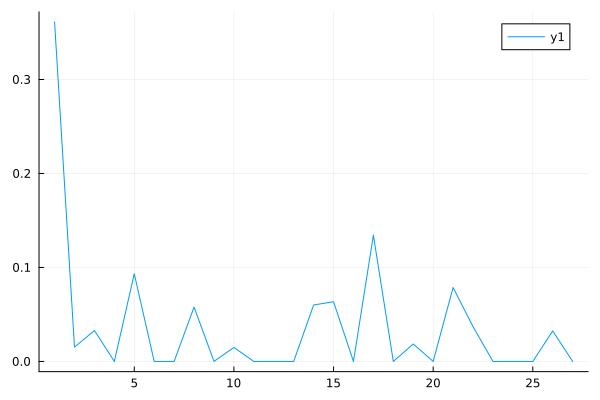

In [132]:
plot(axis_ranges[3],factors[3])

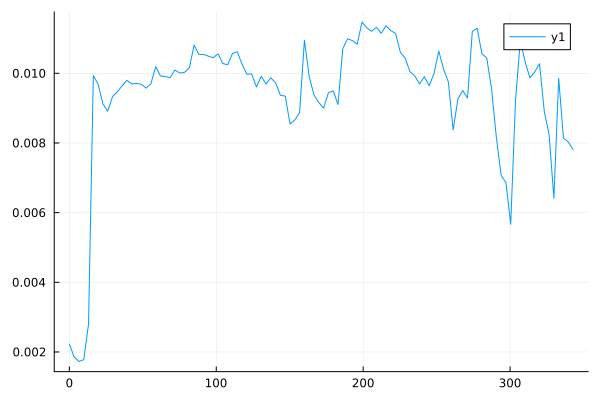

In [128]:
plot(axis_ranges[2],factors[2])

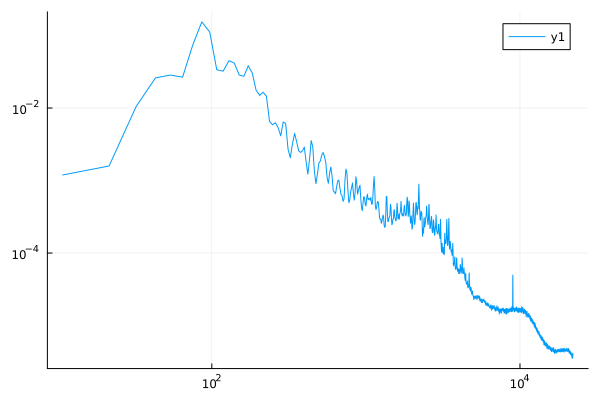

In [129]:
plot(axis_ranges[1][2:end],factors[1][2:end],xscale=:log10,yscale=:log10)

In [60]:
keys = ("a","b","c")
vals = (1, 2, 3)
for (keys, vals) ∈ zip(keys, vals)
    println(keys, vals)
end

a1
b2
c3


In [1]:
Z = Vector(range(0,10,length=10)) * Vector(range(0,5,length=15))'

10×15 Matrix{Float64}:
 0.0  0.0       0.0        0.0       0.0      …   0.0       0.0       0.0
 0.0  0.396825  0.793651   1.19048   1.5873       4.7619    5.15873   5.55556
 0.0  0.793651  1.5873     2.38095   3.1746       9.52381  10.3175   11.1111
 0.0  1.19048   2.38095    3.57143   4.7619      14.2857   15.4762   16.6667
 0.0  1.5873    3.1746     4.7619    6.34921     19.0476   20.6349   22.2222
 0.0  1.98413   3.96825    5.95238   7.93651  …  23.8095   25.7937   27.7778
 0.0  2.38095   4.7619     7.14286   9.52381     28.5714   30.9524   33.3333
 0.0  2.77778   5.55556    8.33333  11.1111      33.3333   36.1111   38.8889
 0.0  3.1746    6.34921    9.52381  12.6984      38.0952   41.2698   44.4444
 0.0  3.57143   7.14286   10.7143   14.2857      42.8571   46.4286   50.0

In [2]:
y = range(0,10,length=10)
x = range(0,5,length=15)

0.0:0.35714285714285715:5.0

In [10]:
size(Z)

(10, 15)

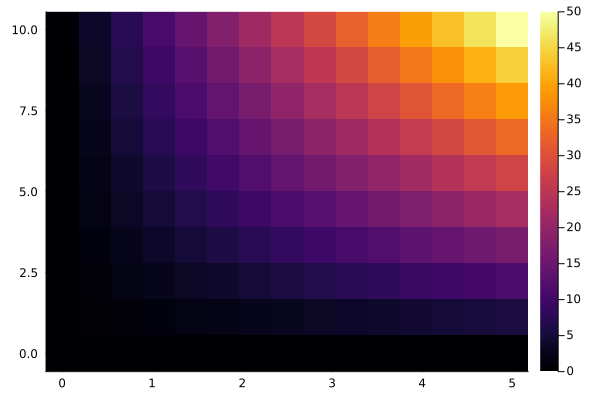

In [4]:
using Plots
heatmap(x,y,Z)

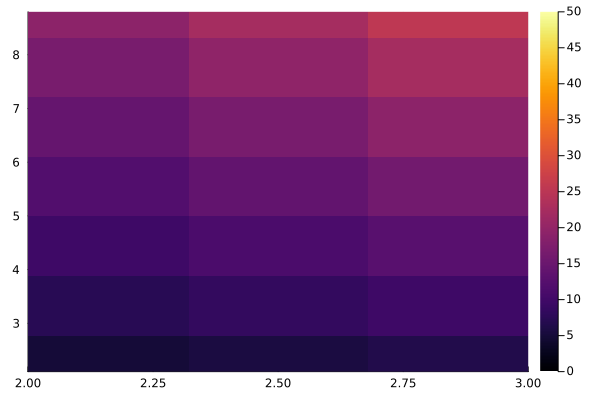

In [6]:
plot!(ylims=(2.1,8.8))

In [10]:
a = 0:10
b = 10:20
c = 3:4

3:4

In [12]:
import Pkg
Pkg.add("Einsum")

    Updating registry at `C:\Users\Nicholas\.julia\registries\General.toml`


   Resolving package versions...

   Installed Einsum ─ v0.4.1


    Updating `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Project.toml`
  [b7d42ee7] + Einsum v0.4.1
    Updating `C:\Users\Nicholas\OneDrive - UBC\UBC\Courses\MATH 605D Tensors\Final Project\TensorDecompSTFT\Manifest.toml`


  [b7d42ee7] + Einsum v0.4.1


Precompiling 

project...

  ✓ Einsum


  ✗ TensorDecompSTFT


  1 dependency successfully precompiled in 8 seconds. 169 already precompiled.
  1 dependency errored. To see a full report either run `import Pkg; Pkg.precompile()` or load the package


In [13]:
using Einsum
@einsum S[i] := a[i] * b[i]

11-element Vector{Int64}:
   0
  11
  24
  39
  56
  75
  96
 119
 144
 171
 200

In [14]:
A = randn(15, 10)
t = range(-1,1,length=15);

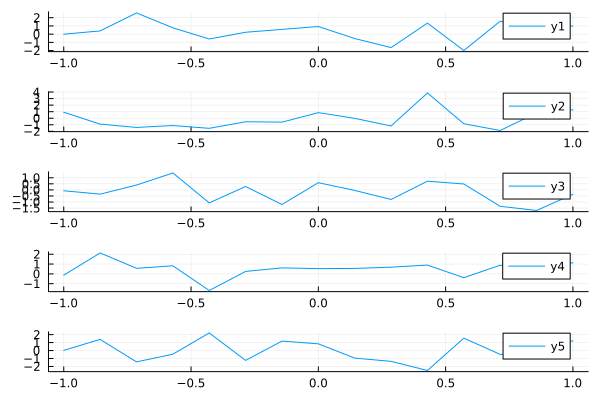

In [16]:
plot(t,A[:,1:5],layout=(5,1))

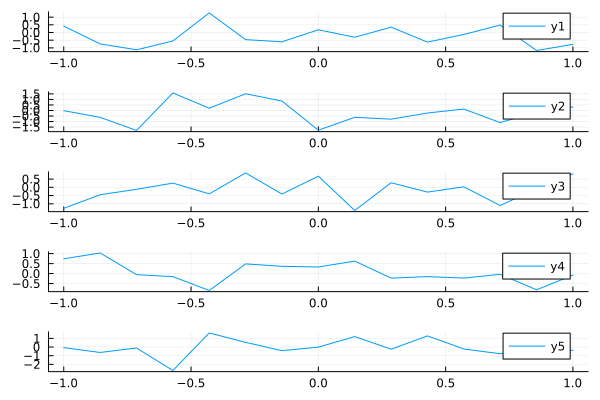

In [17]:
plot(t,A[:,6:10],layout=(5,1))

In [22]:
function normalize!(y::Array{T}) where {T <: Real}
    headroom = 0.95
    y .*= headroom/maximum(abs.(y))
end

normalize! (generic function with 1 method)

In [20]:
y = randn(10)

10-element Vector{Float64}:
 -1.0151302466449585
 -0.1909232607983222
 -0.2420043688401178
  1.2369749407918105
 -1.3778028697752929
 -0.852778040478888
  0.13494400711487808
 -0.4722542247135241
 -1.6409460746078346
  0.15605084113063794

In [25]:
normalize!(y)

10-element Vector{Float64}:
 -0.5876937391395898
 -0.11053202817877664
 -0.14010463473216578
  0.7161272463100655
 -0.797657367625162
 -0.4937024750484605
  0.07812371700866014
 -0.2734041784920126
 -0.95
  0.09034318760873083